In [1]:
!pip install pytorch-gradcam --quiet

import os
import torch
import scipy.io
import torchvision
import tarfile
import seaborn as sns
import torch.nn as nn
import numpy as np
import torch.nn.functional as F
from torchvision.datasets.utils import download_url
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.transforms as tt
from torch.utils.data import random_split
from torchvision.utils import make_grid
import matplotlib
import pandas as pd
import matplotlib.pyplot as plt
from gradcam import GradCAM, GradCAMpp
from gradcam.utils import visualize_cam
from torchvision.models import resnet50

%matplotlib inline

matplotlib.rcParams['figure.facecolor'] = '#ffffff'


     |████████████████████████████████| 6.0MB 14.3MB/s 


In [2]:
# downloading dataset

url = "http://imagenet.stanford.edu/internal/car196/car_ims.tgz"
download_url(url, '.')

with tarfile.open('./car_ims.tgz', 'r:gz') as tar:
  tar.extractall(path="./data")

metadata_url = "http://imagenet.stanford.edu/internal/car196/cars_annos.mat"
download_url(metadata_url, '.')

# Data Exploration

In [3]:
data_path = 'data/car_ims'
print('Total images in data: ', len(os.listdir(data_path)))

Total images in data:  16185


In [4]:
car_annots = scipy.io.loadmat( 'cars_annos.mat')

In [5]:
# format : fname, x1, y1, x2, y2, class
cars_metadata = pd.DataFrame(columns=['fname', 'class', 'x1', 'y1', 'x2', 'y2'])

for fl in car_annots['annotations'][0]:
  cars_metadata = cars_metadata.append({
      'fname': os.path.basename(fl[0].item()),
      'class': fl[5].item(),
      'x1': fl[1].item(),
      'y1': fl[2].item(),
      'x2': fl[3].item(),
      'y2': fl[4].item(),
  }, ignore_index=True)


cars_metadata.describe()

,fname,class,x1,y1,x2,y2
count,16185,16185,16185,16185,16185,16185
unique,16185,196,504,620,1739,1307
top,016042.jpg,119,1,1,618,163
freq,1,136,339,203,81,64


In [6]:
label_to_class = {}

for label, name in  enumerate(car_annots['class_names'][0]):
  label_to_class[label+1] = name.item()

In [7]:
print('Total Classes: ', len(label_to_class))

Total Classes:  196


In [8]:
# move data to class folders
ds_folder = 'data/cars_dataset'
if not os.path.exists(ds_folder): os.mkdir(ds_folder)

for _, data in cars_metadata.iterrows():
  if not os.path.exists(f"{ds_folder}/{data['class']}"): os.mkdir(f"{ds_folder}/{data['class']}")
  os.system(f"mv {data_path}/{data['fname']} {ds_folder}/{data['class']}/{data['fname']}")


In [9]:
images_per_class = cars_metadata.groupby('class').agg({'fname':['count']})
min_label = images_per_class[images_per_class[('fname', 'count')] == images_per_class[('fname', 'count')].min()].index.item()
print("The weakest class is: ", label_to_class[min_label])

The weakest class is:  Hyundai Accent Sedan 2012


In [13]:
weakest_class_label = dataset.class_to_idx[f'{min_label}']
print('Label of weakest class: ', weakest_class_label)

Label of weakest class:  41


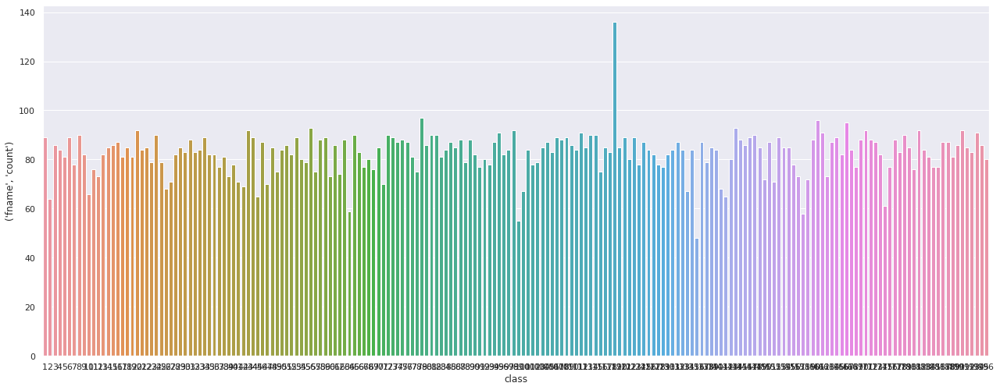

In [38]:
import seaborn as sns

images_per_class.reset_index().columns#.plot.pie(y='class', figsize=(15,15), legend=False)

sns.set(rc={'figure.figsize':(21.7,8.27)})
sns.barplot(x="class", y=('fname', 'count'), data=images_per_class.reset_index())


In [11]:
stats = ((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
img_size_post_rehape = 224
train_tfms = tt.Compose([
                         tt.Resize((img_size_post_rehape, img_size_post_rehape)),
                         tt.RandomCrop(img_size_post_rehape, padding=4, padding_mode='reflect'),
                         tt.RandomHorizontalFlip(),
                         tt.RandomApply([tt.ColorJitter(brightness= 0.25, contrast=0.45, saturation=0.25)], 0.5),
                         tt.ToTensor(),
                         tt.Normalize(*stats, inplace=True)
])

dataset = ImageFolder(ds_folder, transform=train_tfms)

print("Number of examples in the dataset: ", len(dataset))

16185

In [12]:
val_percent = 0.4
val_size = int(val_percent*len(dataset))
train_size = len(dataset) - val_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])

In [14]:
BS = 32
train_dl = DataLoader(train_ds, BS, shuffle=True, num_workers=3, pin_memory=True)
val_dl = DataLoader(val_ds, 2*BS, num_workers=3, pin_memory=True)
print("Number of batches in the training dataset: {len(train_dl)}")
print("Number of batches in the validation dataset: ", len(val_dl))

(304, 102)

In [15]:
for images, labels in train_dl:
  print("images.shape: ", images.shape)
  break

images.shape:  torch.Size([32, 3, 224, 224])


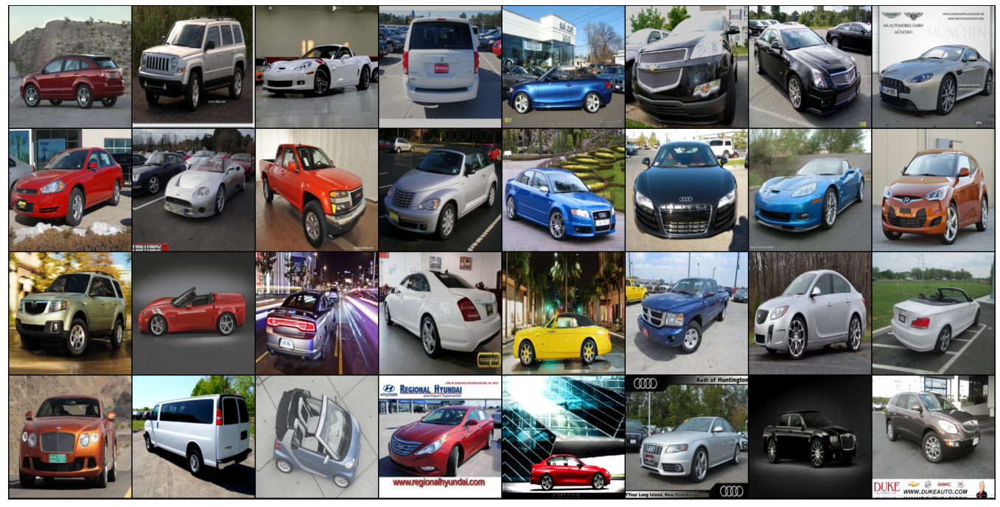

In [16]:
def denormalize(images, means, stds):
  means = torch.tensor(means).reshape(1,3,1,1)
  stds = torch.tensor(stds).reshape(1,3,1,1)
  return images * stds + means

def show_batch(dl):
  for images, labels in dl:
    fig, ax = plt.subplots(figsize=(24,24))
    ax.set_xticks([]); ax.set_yticks([]);
    denorm_images = denormalize(images, *stats)
    ax.imshow(make_grid(denorm_images[:64], nrow=8).permute(1,2, 0).clamp(0,1))
    break

show_batch(train_dl)

# Model & Training

In [17]:
model = resnet50(pretrained=True)

last_layer_features = model.fc.in_features
print("model.fc.in_features: ", last_layer_features)
model.fc = nn.Linear(last_layer_features, 196)
# print(model)


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth



model.fc.in_features:  2048


In [18]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

cuda


In [19]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)


class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)


In [20]:
# moving everything to GPU
train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
model = to_device(model, device)

In [21]:
for images, labels in train_dl:
  print("images.shape: ", images.shape)
  out = model(images)
  print("out.shape: ", out.shape)
  break

images.shape:  torch.Size([32, 3, 224, 224])
out.shape:  torch.Size([32, 196])


In [22]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = []

    for images, labels in val_loader:
      out = model(images)
      loss = F.cross_entropy(out, labels)
      acc = accuracy(out, labels)
      outputs.append({'val_loss': loss.detach(), 'val_acc': acc})

    batch_losses = [x['val_loss'] for x in outputs]
    epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
    batch_accs = [x['val_acc'] for x in outputs]
    epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies

    return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    

def get_lr(optimizer):
  for param_group in optimizer.param_groups:
    return param_group['lr']

def fit_one_cycle(epochs, max_lr, model, train_loader, val_loader,weight_decay=0,
                  grad_clip=None, opt_func=torch.optim.SGD):
  torch.cuda.empty_cache()

  history = []

  optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)

  sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs,
                                              steps_per_epoch=len(train_loader))
  
  for epoch in range(epochs):
    model.train()
    train_losses = []
    lrs = []

    for images, labels in train_loader:
      out = model(images)
      loss = F.cross_entropy(out, labels)
      train_losses.append(loss)
      loss.backward()

      if grad_clip:
        nn.utils.clip_grad_value_(model.parameters(), grad_clip)
      
      optimizer.step()
      optimizer.zero_grad()

      lrs.append(get_lr(optimizer))
      sched.step()

    results = evaluate(model, val_loader)
    results['train_loss'] = torch.stack(train_losses).mean().item()
    results['lrs'] = lrs
    print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, results['lrs'][-1], results['train_loss'], results['val_loss'], results['val_acc']))

    history.append(results)

  return history

In [23]:
epochs = 5
max_lr = 0.001
grad_clip = 0.1
weight_decay = 1e-5
opt_func = torch.optim.Adam

In [24]:
%%time
# without resnet params
history = []
history += fit_one_cycle(epochs, max_lr, model, train_dl, val_dl,
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=opt_func)


Epoch [0], last_lr: 0.00076, train_loss: 4.2159, val_loss: 6.2002, val_acc: 0.0438
Epoch [1], last_lr: 0.00095, train_loss: 3.0593, val_loss: 2.8023, val_acc: 0.2715
Epoch [2], last_lr: 0.00061, train_loss: 1.8659, val_loss: 1.6502, val_acc: 0.5172
Epoch [3], last_lr: 0.00019, train_loss: 0.9645, val_loss: 0.8346, val_acc: 0.7585
Epoch [4], last_lr: 0.00000, train_loss: 0.4769, val_loss: 0.6825, val_acc: 0.8040
CPU times: user 3min 44s, sys: 1min 41s, total: 5min 25s
Wall time: 16min 1s


# GRADCAM Vizualization

In [52]:
def predict_single(image):
    xb = image.unsqueeze(0)
    xb = to_device(xb, device)
    preds = model(xb)
    _, preds = torch.max(preds, dim=1)
    prediction = preds[0].item()
    return prediction

idx_to_class = dict([(y,x) for x,y in train_ds.dataset.class_to_idx.items()])

In [53]:
configs = [
    dict(model_type='resnet', arch=model.eval(), layer_name='layer4'),
    dict(model_type='resnet', arch=model.eval(), layer_name='layer3'),
    dict(model_type='resnet', arch=model.eval(), layer_name='layer2'),
    dict(model_type='resnet', arch=model.eval(), layer_name='layer1'),
]

cams = [[cls.from_config(**config) for cls in (GradCAM, GradCAMpp)] for config in configs]

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


Hyundai Accent Sedan 2012


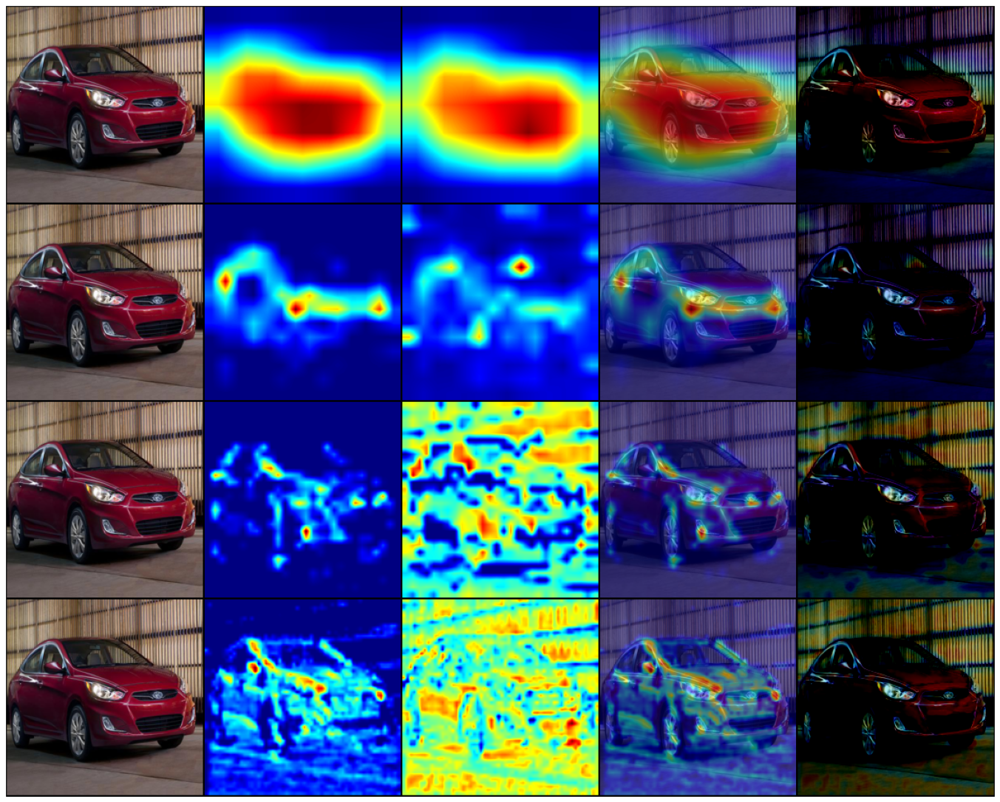

In [57]:
# GRADCAM for correctly predicted label
images = []

for batch in val_dl:
  imgs, labels = batch
  images_ = imgs[labels.cpu() == weakest_class_label]
  if images_.numel() == 0:
    continue
  normed_torch_img = None
  for ni in images_:
    predicted_label_for_weak_class = predict_single(ni)
    if predicted_label_for_weak_class == weakest_class_label:
      normed_torch_img = ni
      break
  
  if normed_torch_img == None:
    continue

  normed_torch_img = torch.unsqueeze(normed_torch_img, 0)
  torch_img = to_device(denormalize(normed_torch_img.cpu(), *stats), device)
  wrong_label = weakest_class_label-1 if weakest_class_label-1 >=0 else weakest_class_label+1
  for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, normed_torch_img)

    images.extend([torch_img.cpu()[0], heatmap, heatmap_pp, result, result_pp])
  
  break

grid_image = make_grid(images, nrow=5)
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xticks([]); ax.set_yticks([]);
# denorm_images = denormalize(images, *stats)
ax.imshow(grid_image.permute(1,2, 0).clamp(0,1))
print("GRADCAM for correctly predicted label: ", label_to_class[int(idx_to_class[predicted_label_for_weak_class])])

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


Ford Fiesta Sedan 2012


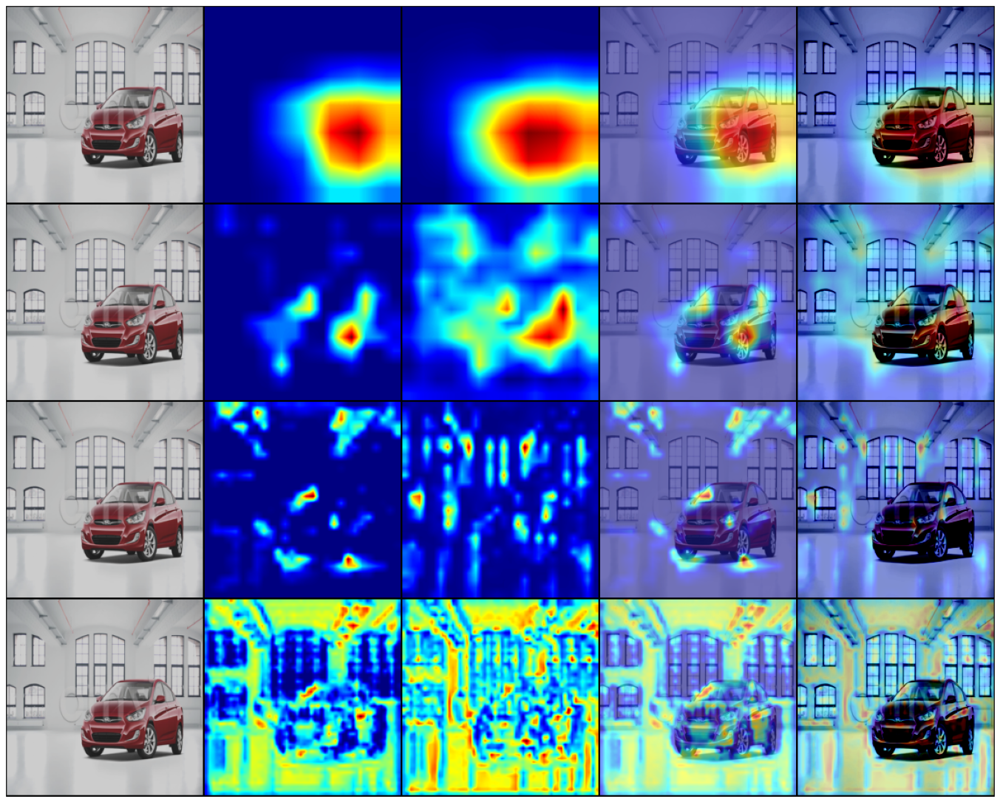

In [58]:
# GRADCAM for incorrectly predicted label
images = []

for batch in val_dl:
  imgs, labels = batch
  images_ = imgs[labels.cpu() == weakest_class_label]
  if images_.numel() == 0:
    continue
  normed_torch_img = None
  for ni in images_:
    predicted_label_for_weak_class = predict_single(ni)
    if predicted_label_for_weak_class != weakest_class_label:
      normed_torch_img = ni
      break
  
  if normed_torch_img == None:
    continue

  normed_torch_img = torch.unsqueeze(normed_torch_img, 0)
  torch_img = to_device(denormalize(normed_torch_img.cpu(), *stats), device)
  wrong_label = weakest_class_label-1 if weakest_class_label-1 >=0 else weakest_class_label+1
  for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, normed_torch_img)

    images.extend([torch_img.cpu()[0], heatmap, heatmap_pp, result, result_pp])
  
  break

grid_image = make_grid(images, nrow=5)
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xticks([]); ax.set_yticks([]);
# denorm_images = denormalize(images, *stats)
ax.imshow(grid_image.permute(1,2, 0).clamp(0,1))
print("GRADCAM for incorrectly predicted label: ", label_to_class[int(idx_to_class[predicted_label_for_weak_class])])

# +Random Oversampling

In [60]:
# ! git clone https://github.com/ufoym/imbalanced-dataset-sampler
# ! python imbalanced-dataset-sampler/setup.py install
# ! pip install imbalanced-dataset-sampler/.


In [76]:
dataset = ImageFolder(ds_folder, transform=train_tfms)
val_percent = 0.4
val_size = int(val_percent*len(dataset))
train_size = len(dataset) - val_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])

In [77]:
from torchsampler import ImbalancedDatasetSampler
BS = 32
train_dl = DataLoader(train_ds, BS, sampler=ImbalancedDatasetSampler(train_ds), num_workers=3, pin_memory=True)
val_dl = DataLoader(val_ds, 2*BS, num_workers=3, pin_memory=True)
print("Number of batches in the training dataset:", len(train_dl))
print("Number of batches in the validation dataset: ", len(val_dl))

Number of batches in the training dataset: 304
Number of batches in the validation dataset:  102


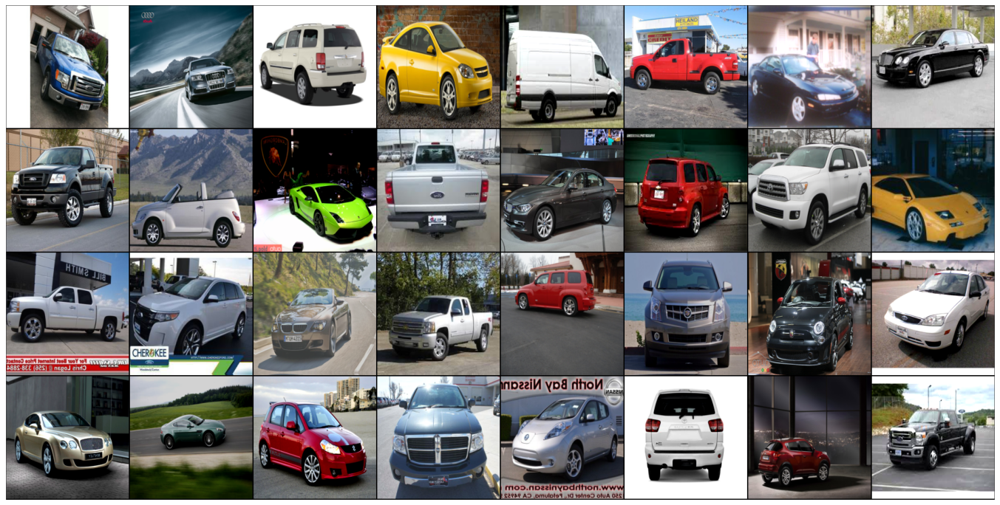

In [78]:
show_batch(train_dl)

In [79]:
model = resnet50(pretrained=True)

last_layer_features = model.fc.in_features
print("model.fc.in_features: ", last_layer_features)
model.fc = nn.Linear(last_layer_features, 196)

model.fc.in_features:  2048


In [80]:
# moving everything to GPU
train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
model = to_device(model, device)

In [ ]:
epochs = 5
max_lr = 0.001
grad_clip = 0.1
weight_decay = 1e-5
opt_func = torch.optim.Adam

In [81]:
%%time
# without resnet params
history = []
history += fit_one_cycle(epochs, max_lr, model, train_dl, val_dl,
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=opt_func)


Epoch [0], last_lr: 0.00076, train_loss: 4.1263, val_loss: 4.4119, val_acc: 0.1015
Epoch [1], last_lr: 0.00095, train_loss: 2.9409, val_loss: 3.1146, val_acc: 0.2390
Epoch [2], last_lr: 0.00061, train_loss: 1.7258, val_loss: 1.8206, val_acc: 0.4915
Epoch [3], last_lr: 0.00019, train_loss: 0.8444, val_loss: 0.8338, val_acc: 0.7624
Epoch [4], last_lr: 0.00000, train_loss: 0.4513, val_loss: 0.6906, val_acc: 0.7978
CPU times: user 3min 44s, sys: 1min 40s, total: 5min 24s
Wall time: 16min 5s


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


GRADCAM for correctly predicted label:  Hyundai Accent Sedan 2012


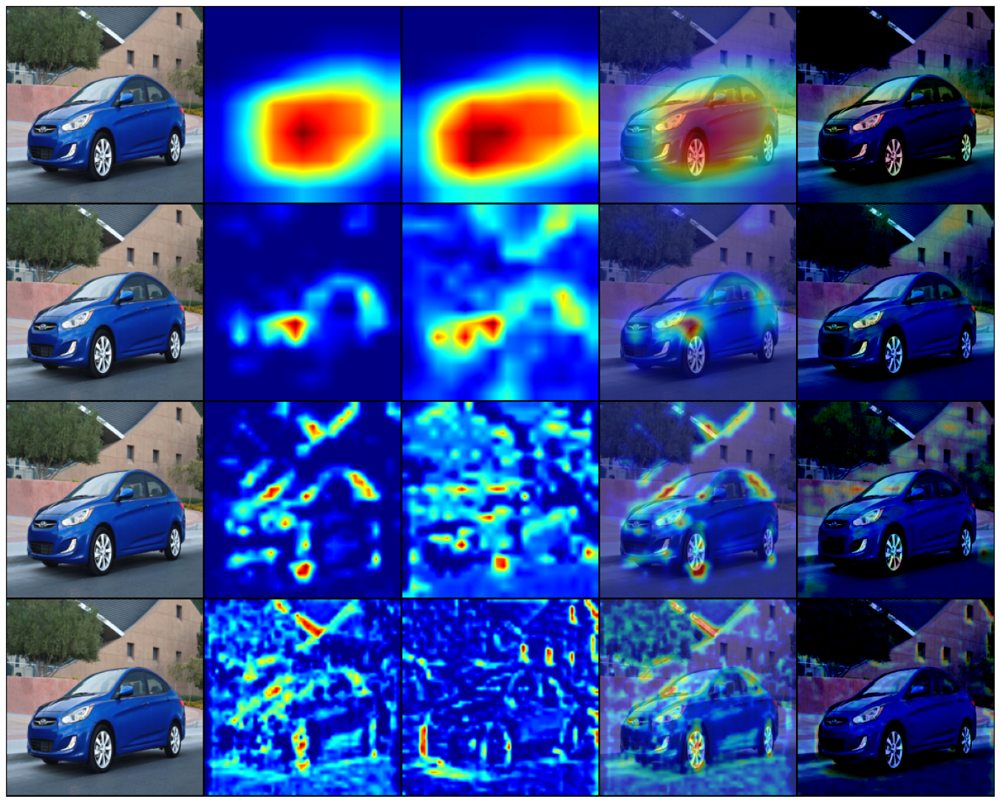

In [82]:
# GRADCAM for correctly predicted label
images = []

for batch in val_dl:
  imgs, labels = batch
  images_ = imgs[labels.cpu() == weakest_class_label]
  if images_.numel() == 0:
    continue
  normed_torch_img = None
  for ni in images_:
    predicted_label_for_weak_class = predict_single(ni)
    if predicted_label_for_weak_class == weakest_class_label:
      normed_torch_img = ni
      break
  
  if normed_torch_img == None:
    continue

  normed_torch_img = torch.unsqueeze(normed_torch_img, 0)
  torch_img = to_device(denormalize(normed_torch_img.cpu(), *stats), device)
  wrong_label = weakest_class_label-1 if weakest_class_label-1 >=0 else weakest_class_label+1
  for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, normed_torch_img)

    images.extend([torch_img.cpu()[0], heatmap, heatmap_pp, result, result_pp])
  
  break

grid_image = make_grid(images, nrow=5)
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xticks([]); ax.set_yticks([]);
# denorm_images = denormalize(images, *stats)
ax.imshow(grid_image.permute(1,2, 0).clamp(0,1))
print("GRADCAM for correctly predicted label: ", label_to_class[int(idx_to_class[predicted_label_for_weak_class])])

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


GRADCAM for incorrectly predicted label:  Lamborghini Aventador Coupe 2012


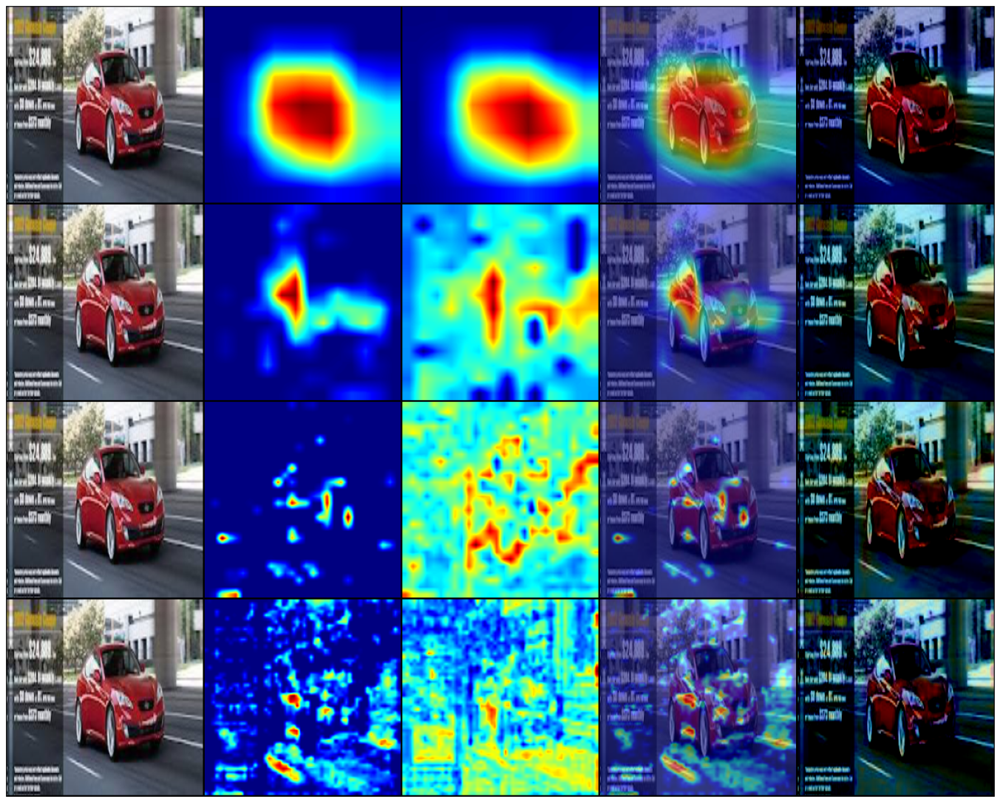

In [83]:
# GRADCAM for incorrectly predicted label
images = []

for batch in val_dl:
  imgs, labels = batch
  images_ = imgs[labels.cpu() == weakest_class_label]
  if images_.numel() == 0:
    continue
  normed_torch_img = None
  for ni in images_:
    predicted_label_for_weak_class = predict_single(ni)
    if predicted_label_for_weak_class != weakest_class_label:
      normed_torch_img = ni
      break
  
  if normed_torch_img == None:
    continue

  normed_torch_img = torch.unsqueeze(normed_torch_img, 0)
  torch_img = to_device(denormalize(normed_torch_img.cpu(), *stats), device)
  wrong_label = weakest_class_label-1 if weakest_class_label-1 >=0 else weakest_class_label+1
  for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, normed_torch_img)

    images.extend([torch_img.cpu()[0], heatmap, heatmap_pp, result, result_pp])
  
  break

grid_image = make_grid(images, nrow=5)
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xticks([]); ax.set_yticks([]);
# denorm_images = denormalize(images, *stats)
ax.imshow(grid_image.permute(1,2, 0).clamp(0,1))
print("GRADCAM for incorrectly predicted label: ", label_to_class[int(idx_to_class[predicted_label_for_weak_class])])

# +Grayscaling to reduce effect of color on prediction

In [90]:
stats = ((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
img_size_post_rehape = 224
train_tfms = tt.Compose([
                         tt.Resize((img_size_post_rehape, img_size_post_rehape)),
                         tt.RandomCrop(img_size_post_rehape, padding=4, padding_mode='reflect'),
                         tt.RandomHorizontalFlip(),
                         tt.RandomApply([tt.ColorJitter(brightness= 0.25, contrast=0.45, saturation=0.25)], 0.5),
                         tt.Grayscale(num_output_channels=3),
                         tt.ToTensor(),
                         tt.Normalize(*stats, inplace=True)
])

dataset = ImageFolder(ds_folder, transform=train_tfms)

print("Number of examples in the dataset: ", len(dataset))

Number of examples in the dataset:  16185


In [91]:
dataset = ImageFolder(ds_folder, transform=train_tfms)
val_percent = 0.4
val_size = int(val_percent*len(dataset))
train_size = len(dataset) - val_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])

In [92]:
from torchsampler import ImbalancedDatasetSampler
BS = 32
train_dl = DataLoader(train_ds, BS, sampler=ImbalancedDatasetSampler(train_ds), num_workers=3, pin_memory=True)
val_dl = DataLoader(val_ds, 2*BS, num_workers=3, pin_memory=True)
print("Number of batches in the training dataset:", len(train_dl))
print("Number of batches in the validation dataset: ", len(val_dl))

Number of batches in the training dataset: 304
Number of batches in the validation dataset:  102


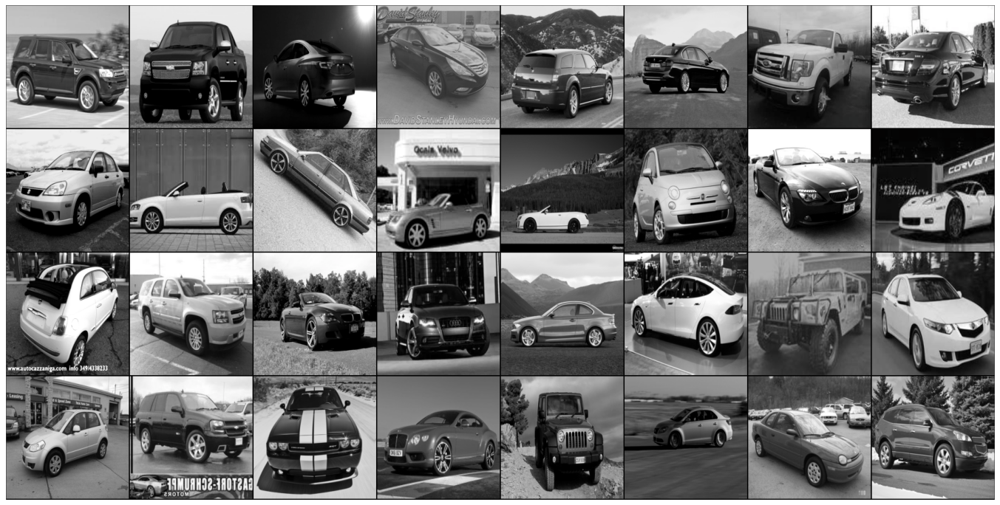

In [93]:
show_batch(train_dl)

In [94]:
model = resnet50(pretrained=True)

last_layer_features = model.fc.in_features
print("model.fc.in_features: ", last_layer_features)
model.fc = nn.Linear(last_layer_features, 196)

model.fc.in_features:  2048


In [95]:
# moving everything to GPU
train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
model = to_device(model, device)

In [98]:
epochs = 5
max_lr = 0.0005
grad_clip = 0.2
weight_decay = 1e-4
opt_func = torch.optim.Adam

In [99]:
%%time
# without resnet params
history = []
history += fit_one_cycle(epochs, max_lr, model, train_dl, val_dl,
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=opt_func)


Epoch [0], last_lr: 0.00038, train_loss: 0.9500, val_loss: 1.4818, val_acc: 0.5721
Epoch [1], last_lr: 0.00048, train_loss: 1.0707, val_loss: 1.4618, val_acc: 0.5878
Epoch [2], last_lr: 0.00031, train_loss: 0.7313, val_loss: 0.9290, val_acc: 0.7253
Epoch [3], last_lr: 0.00009, train_loss: 0.3838, val_loss: 0.6471, val_acc: 0.8067
Epoch [4], last_lr: 0.00000, train_loss: 0.2297, val_loss: 0.5986, val_acc: 0.8172
CPU times: user 3min 49s, sys: 1min 39s, total: 5min 28s
Wall time: 16min 23s


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


GRADCAM for correctly predicted label:  Hyundai Accent Sedan 2012


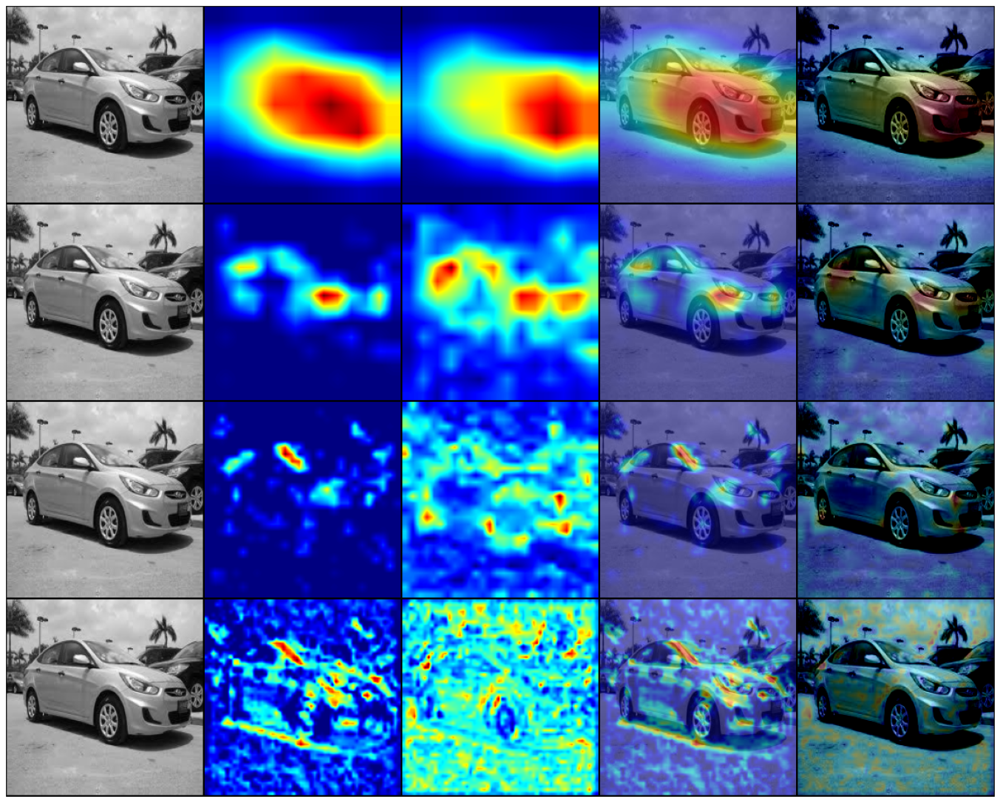

In [100]:
# GRADCAM for correctly predicted label
images = []

for batch in val_dl:
  imgs, labels = batch
  images_ = imgs[labels.cpu() == weakest_class_label]
  if images_.numel() == 0:
    continue
  normed_torch_img = None
  for ni in images_:
    predicted_label_for_weak_class = predict_single(ni)
    if predicted_label_for_weak_class == weakest_class_label:
      normed_torch_img = ni
      break
  
  if normed_torch_img == None:
    continue

  normed_torch_img = torch.unsqueeze(normed_torch_img, 0)
  torch_img = to_device(denormalize(normed_torch_img.cpu(), *stats), device)
  wrong_label = weakest_class_label-1 if weakest_class_label-1 >=0 else weakest_class_label+1
  for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, normed_torch_img)

    images.extend([torch_img.cpu()[0], heatmap, heatmap_pp, result, result_pp])
  
  break

grid_image = make_grid(images, nrow=5)
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xticks([]); ax.set_yticks([]);
# denorm_images = denormalize(images, *stats)
ax.imshow(grid_image.permute(1,2, 0).clamp(0,1))
print("GRADCAM for correctly predicted label: ", label_to_class[int(idx_to_class[predicted_label_for_weak_class])])

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2952: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


GRADCAM for incorrectly predicted label:  Hyundai Veloster Hatchback 2012


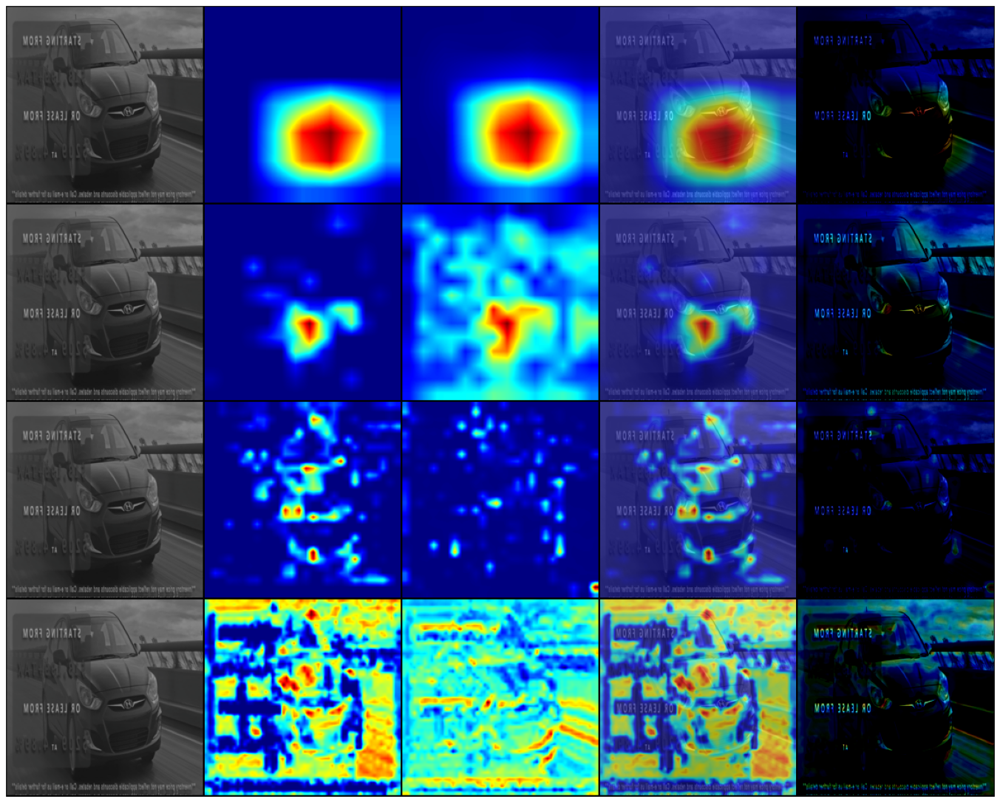

In [101]:
# GRADCAM for incorrectly predicted label
images = []

for batch in val_dl:
  imgs, labels = batch
  images_ = imgs[labels.cpu() == weakest_class_label]
  if images_.numel() == 0:
    continue
  normed_torch_img = None
  for ni in images_:
    predicted_label_for_weak_class = predict_single(ni)
    if predicted_label_for_weak_class != weakest_class_label:
      normed_torch_img = ni
      break
  
  if normed_torch_img == None:
    continue

  normed_torch_img = torch.unsqueeze(normed_torch_img, 0)
  torch_img = to_device(denormalize(normed_torch_img.cpu(), *stats), device)
  wrong_label = weakest_class_label-1 if weakest_class_label-1 >=0 else weakest_class_label+1
  for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, normed_torch_img)

    images.extend([torch_img.cpu()[0], heatmap, heatmap_pp, result, result_pp])
  
  break

grid_image = make_grid(images, nrow=5)
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xticks([]); ax.set_yticks([]);
# denorm_images = denormalize(images, *stats)
ax.imshow(grid_image.permute(1,2, 0).clamp(0,1))
print("GRADCAM for incorrectly predicted label: ", label_to_class[int(idx_to_class[predicted_label_for_weak_class])])

# +RandomPerspective & Image Dimensions

In [142]:
stats = ((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
img_size_post_rehape = 300
train_tfms = tt.Compose([
                         tt.Resize((img_size_post_rehape, img_size_post_rehape)),
                         tt.RandomCrop(img_size_post_rehape, padding=4, padding_mode='reflect'),
                         tt.RandomHorizontalFlip(),
                         tt.RandomApply([tt.ColorJitter(brightness= 0.25, contrast=0.45, saturation=0.25)], 0.5),
                         tt.RandomPerspective(distortion_scale=0.24, p=0.2),
                         tt.Grayscale(num_output_channels=3),
                         tt.ToTensor(),
                         tt.Normalize(*stats, inplace=True)
])

dataset = ImageFolder(ds_folder, transform=train_tfms)

print("Number of examples in the dataset: ", len(dataset))

Number of examples in the dataset:  16185


In [143]:
dataset = ImageFolder(ds_folder, transform=train_tfms)
val_percent = 0.4
val_size = int(val_percent*len(dataset))
train_size = len(dataset) - val_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])

In [144]:
from torchsampler import ImbalancedDatasetSampler
BS = 32
train_dl = DataLoader(train_ds, BS, sampler=ImbalancedDatasetSampler(train_ds), num_workers=3, pin_memory=True)
val_dl = DataLoader(val_ds, 2*BS, num_workers=3, pin_memory=True)
print("Number of batches in the training dataset:", len(train_dl))
print("Number of batches in the validation dataset: ", len(val_dl))

Number of batches in the training dataset: 304
Number of batches in the validation dataset:  102


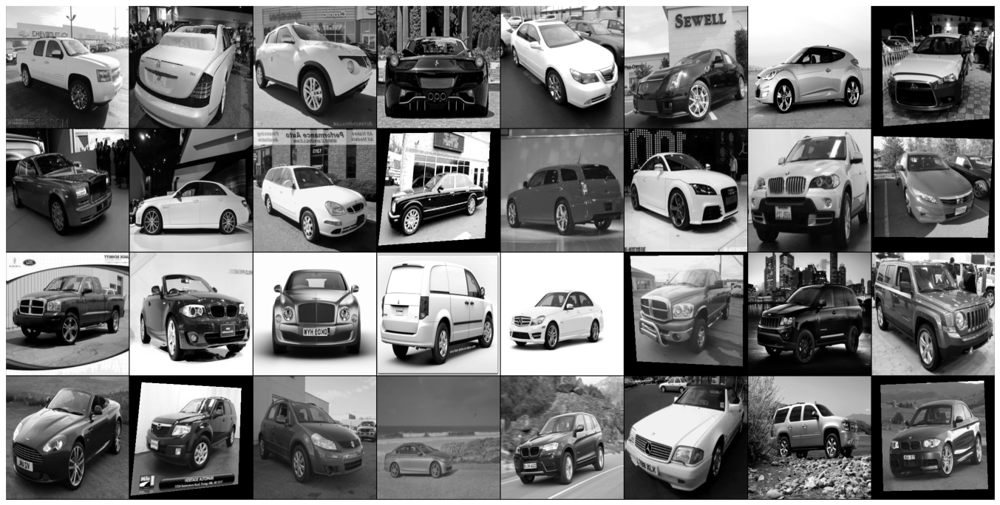

In [145]:
show_batch(train_dl)

In [146]:
model = resnet50(pretrained=True)

last_layer_features = model.fc.in_features
print("model.fc.in_features: ", last_layer_features)
model.fc = nn.Linear(last_layer_features, 196)

model.fc.in_features:  2048


In [147]:
# moving everything to GPU
train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
model = to_device(model, device)

In [148]:
epochs = 5
max_lr = 0.0005
grad_clip = 0.2
weight_decay = 1e-4
opt_func = torch.optim.Adam

In [149]:
%%time
# without resnet params
history = []
history += fit_one_cycle(epochs, max_lr, model, train_dl, val_dl,
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=opt_func)


Epoch [0], last_lr: 0.00038, train_loss: 4.3908, val_loss: 3.4341, val_acc: 0.1639
Epoch [1], last_lr: 0.00048, train_loss: 2.4515, val_loss: 3.2235, val_acc: 0.2447
Epoch [2], last_lr: 0.00031, train_loss: 1.2800, val_loss: 1.2908, val_acc: 0.6280
Epoch [3], last_lr: 0.00009, train_loss: 0.5659, val_loss: 0.5812, val_acc: 0.8314
Epoch [4], last_lr: 0.00000, train_loss: 0.3278, val_loss: 0.4857, val_acc: 0.8639
CPU times: user 7min 57s, sys: 5min 44s, total: 13min 41s
Wall time: 23min 52s


In [ ]:
# GRADCAM for correctly predicted label
images = []

for batch in val_dl:
  imgs, labels = batch
  images_ = imgs[labels.cpu() == weakest_class_label]
  if images_.numel() == 0:
    continue
  normed_torch_img = None
  for ni in images_:
    predicted_label_for_weak_class = predict_single(ni)
    if predicted_label_for_weak_class == weakest_class_label:
      normed_torch_img = ni
      break
  
  if normed_torch_img == None:
    continue

  normed_torch_img = torch.unsqueeze(normed_torch_img, 0)
  torch_img = to_device(denormalize(normed_torch_img.cpu(), *stats), device)
  wrong_label = weakest_class_label-1 if weakest_class_label-1 >=0 else weakest_class_label+1
  for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, normed_torch_img)

    images.extend([torch_img.cpu()[0], heatmap, heatmap_pp, result, result_pp])
  
  break

grid_image = make_grid(images, nrow=5)
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xticks([]); ax.set_yticks([]);
# denorm_images = denormalize(images, *stats)
ax.imshow(grid_image.permute(1,2, 0).clamp(0,1))
print("GRADCAM for correctly predicted label: ", label_to_class[int(idx_to_class[predicted_label_for_weak_class])])

In [ ]:
# GRADCAM for incorrectly predicted label
images = []

for batch in val_dl:
  imgs, labels = batch
  images_ = imgs[labels.cpu() == weakest_class_label]
  if images_.numel() == 0:
    continue
  normed_torch_img = None
  for ni in images_:
    predicted_label_for_weak_class = predict_single(ni)
    if predicted_label_for_weak_class != weakest_class_label:
      normed_torch_img = ni
      break
  
  if normed_torch_img == None:
    continue

  normed_torch_img = torch.unsqueeze(normed_torch_img, 0)
  torch_img = to_device(denormalize(normed_torch_img.cpu(), *stats), device)
  wrong_label = weakest_class_label-1 if weakest_class_label-1 >=0 else weakest_class_label+1
  for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)# GRADCAM for incorrectly predicted label
images = []

for batch in val_dl:
  imgs, labels = batch
  images_ = imgs[labels.cpu() == weakest_class_label]
  if images_.numel() == 0:
    continue
  normed_torch_img = None
  for ni in images_:
    predicted_label_for_weak_class = predict_single(ni)
    if predicted_label_for_weak_class != weakest_class_label:
      normed_torch_img = ni
      break
  
  if normed_torch_img == None:
    continue

  normed_torch_img = torch.unsqueeze(normed_torch_img, 0)
  torch_img = to_device(denormalize(normed_torch_img.cpu(), *stats), device)
  wrong_label = weakest_class_label-1 if weakest_class_label-1 >=0 else weakest_class_label+1
  for gradcam, gradcam_pp in cams:
    mask, _ = gradcam(normed_torch_img)
    heatmap, result = visualize_cam(mask, torch_img)

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, normed_torch_img)

    images.extend([torch_img.cpu()[0], heatmap, heatmap_pp, result, result_pp])
  
  break

grid_image = make_grid(images, nrow=5)
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xticks([]); ax.set_yticks([]);
# denorm_images = denormalize(images, *stats)
ax.imshow(grid_image.permute(1,2, 0).clamp(0,1))
print("GRADCAM for incorrectly predicted label: ", label_to_class[int(idx_to_class[predicted_label_for_weak_class])])

    mask_pp, _ = gradcam_pp(normed_torch_img)
    heatmap_pp, result_pp = visualize_cam(mask_pp, normed_torch_img)

    images.extend([torch_img.cpu()[0], heatmap, heatmap_pp, result, result_pp])
  
  break

grid_image = make_grid(images, nrow=5)
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xticks([]); ax.set_yticks([]);
# denorm_images = denormalize(images, *stats)
ax.imshow(grid_image.permute(1,2, 0).clamp(0,1))
print("GRADCAM for incorrectly predicted label: ", label_to_class[int(idx_to_class[predicted_label_for_weak_class])])

# Plotting & Analysis

In [102]:
def plot_accuracies(history):
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');

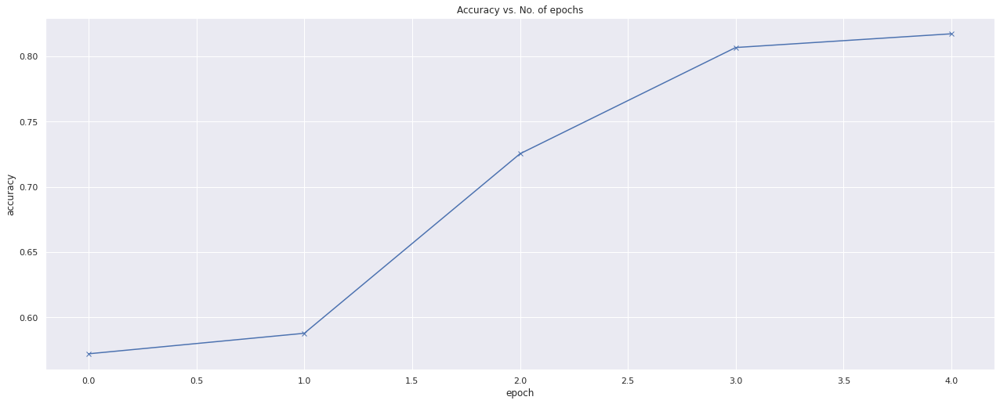

In [103]:
plot_accuracies(history)

In [104]:
def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');


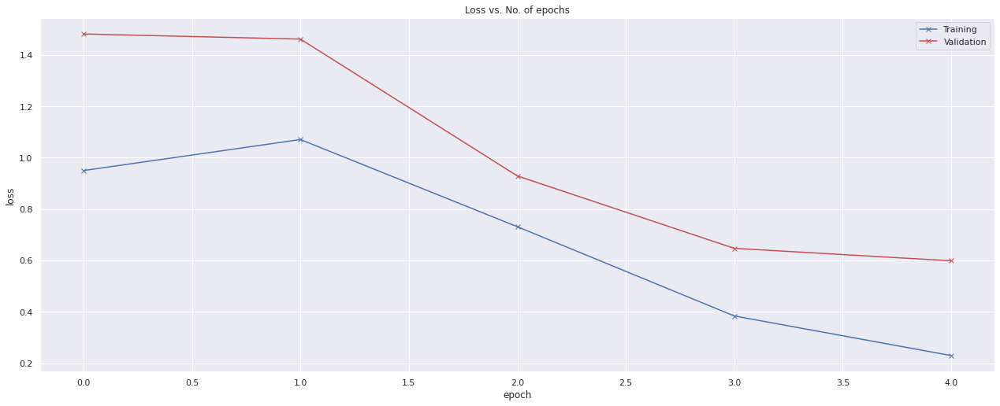

In [105]:
plot_losses(history)


In [106]:
def plot_lrs(history):
    lrs = np.concatenate([x.get('lrs', []) for x in history])
    plt.plot(lrs)
    plt.xlabel('Batch no.')
    plt.ylabel('Learning rate')
    plt.title('Learning Rate vs. Batch no.');


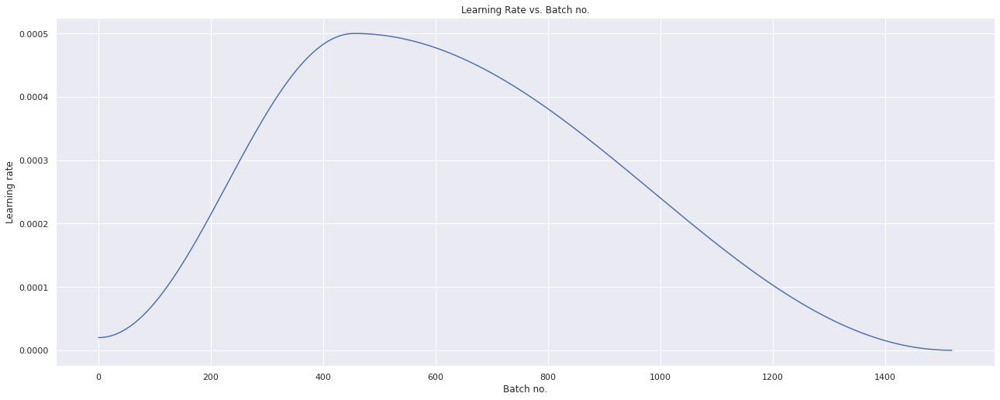

In [107]:
plot_lrs(history)
